Date: 2016-09-19

The goal of this notebook is to:
-  Add the speed criterion to the sharp wave ripples (exclude ripples where the rat is running > 4 cm/sec
-  Look at sharp wave ripple triggered spectrograms and coherences in both the high frequency ranges (100 - 300 Hz) and the low frequency ranges (6-12 Hz, 30-60 Hz)
- Compare ripple-triggered spectrograms/coherences using multitaper method vs. the Frank Lab method
- Compute the Group Delay (frequency vs. phase)

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
import os
import sys
import collections
import random
import itertools
import functools
import scipy.fftpack
import scipy.signal
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import matplotlib.patches as patches
import seaborn as sns
import pandas as pd
import tqdm
import dask
import dask.multiprocessing

sys.path.append('../src/')
import data_filter
import ripples
import spectral

In [2]:
Animal = collections.namedtuple('Animal', {'directory', 'short_name'})
num_days = 8
days = range(1, num_days + 1)
animals = {'HPa': Animal(directory='HPa_direct', short_name='HPa')}

epoch_info = data_filter.make_epochs_dataframe(animals, days)
tetrode_info = data_filter.make_tetrode_dataframe(animals)
epoch_keys = data_filter.get_dataframe_index(epoch_info
    .loc[(['HPa'], [8]), :]
    .loc[epoch_info.environment == 'wtr1'])

cur_tetrode_info = pd.concat([tetrode_info[key] for key in epoch_keys])
cur_tetrode_info

tetrode_index = data_filter.get_dataframe_index(cur_tetrode_info)
lfp_data = data_filter.get_LFP_data(tetrode_index, animals)

## Adding the speed criterion
Sharp wave ripple and replay events occur during pauses in exploration. There are also high frequency gamma events that occur when running. We want to make sure that what we call sharp wave ripples are unambiguously during pauses, so we restrict what we call ripples to times when the rat is moving less than 4 cm/sec. So first we must extract the movement speed from the position file

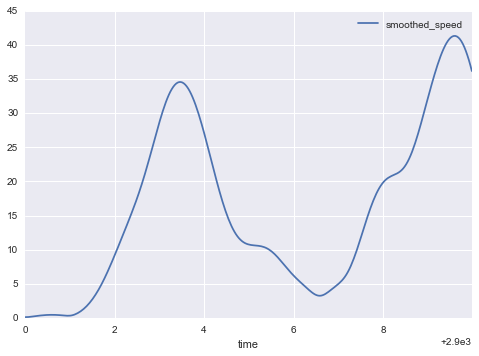

In [9]:
position_dataframe = data_filter.get_position_dataframe(epoch_keys, animals)[0]
position_dataframe.loc[2900:2910].plot(y='smoothed_speed')

In [10]:
sampling_frequency = 1500
CA1_lfp = data_filter.filter_list_by_pandas_series(lfp_data, cur_tetrode_info.area == 'CA1')
# values = [dask.delayed(ripples.get_segments_multitaper)(lfp, sampling_frequency,
#                                                        zscore_threshold=2, minimum_duration=0.015)
#                        for lfp in CA1_lfp]
# segments_multitaper = dask.compute(*values, get=dask.multiprocessing.get)
segments_multitaper = np.load('segments_multitaper.npy')

In [11]:
merged_segments = list(ripples.merge_ranges([seg for tetrode in segments_multitaper
                                         for seg in tetrode]))

speed_threshold = 4
interpolated_position = (pd.concat([lfp_data[0], position_dataframe])
                            .sort_index()
                            .interpolate(method='linear')
                            .reindex(lfp_data[0].index))

average_speed = np.array([interpolated_position.loc[segment_start:segment_end, :].smoothed_speed.mean()
                 for segment_start, segment_end in merged_segments])
ripple_times = [merged_segments[i] for i in np.where(average_speed <= speed_threshold)[0]]
ripple_times_ind = [(ind + 1, start_time, end_time)
                    for ind, (start_time, end_time) in enumerate(ripple_times)]
ripple_df = (ripples._convert_ripple_times_to_dataframe(ripple_times_ind, CA1_lfp)
            .assign(ripple_indicator=lambda x: x.ripple_number.fillna(0) > 0))

In [11]:
def plot_current_segments(segments, time_extent, axis_handle, y_low=-5,
                          height=10, alpha=0.3, color='grey'):
    try:
        seg_in_extent = ((np.array(segments)[:,0] < time_extent[0]) &
                       (np.array(segments)[:,1] > time_extent[1]) > 0).nonzero()
        segs = list(np.array(segments)[seg_in_extent])
        for segment in segments:
                axis_handle.add_patch(ripples.create_box(segment,
                                                         y_low=y_low,
                                                         height=height,
                                                         alpha=alpha,
                                                         color=color))
    except IndexError:
        pass
    
def plot_ripple_metrics(ripple_df, ripple_number, lfp_data, sampling_frequency):    
    ripple_time = ripple_df[ripple_df.ripple_number == ripple_number].index
    ripple_extent = np.array([ripple_time.min(), ripple_time.max()])
    extended_ripple_extent = ripple_extent + [-0.400, 0.400]
    extended_ripple_df = ripple_df.loc[extended_ripple_extent[0]:extended_ripple_extent[1], :]

    extended_ripple_time = extended_ripple_df.index.get_values()
    num_lfps = len(lfp_data)
    
    fig, axis_handles = plt.subplots(num_lfps, 2, figsize=(12, 10), sharex=True)

    min_lfp = extended_ripple_df.electric_potential.min().min()
    max_lfp = extended_ripple_df.electric_potential.max().max()
    lfp_height = max_lfp - min_lfp

    # LFP
    for ind in range(0, num_lfps):
        lfp_data[ind].loc[extended_ripple_extent[0]:extended_ripple_extent[1], :].plot(ax=axis_handles[ind, 0],
                                                                                      legend=False)
        plot_current_segments([tuple(ripple_extent)], extended_ripple_extent, axis_handles[ind, 0],
                      y_low=min_lfp,
                      height=lfp_height)
        
    # Spectrograms
    for ind in range(0, num_lfps):
        frequency_resolution = 50
        time_window_duration = 0.080
        time_window_step = 0.010
        time_halfbandwidth_product = time_window_duration * (frequency_resolution / 2)
        spectrogram = spectral.get_spectrogram_dataframe(lfp_data[ind].loc[extended_ripple_extent[0]:extended_ripple_extent[1], :],
                                                         time_halfbandwidth_product=time_halfbandwidth_product,
                                                         time_window_duration=time_window_duration,
                                                         sampling_frequency=sampling_frequency,
                                                         time_window_step=time_window_step)
        spectral.plot_spectrogram(spectrogram, axis_handles[ind, 1])
        axis_handles[ind, 1].set_ylim((100, 300))
        axis_handles[ind, 1].set_ylabel('')
        axis_handles[ind, 1].hlines(150, extended_ripple_extent[0], extended_ripple_extent[1],
                               color='white', linestyle='--', linewidth=0.5)
        axis_handles[ind, 1].hlines(250, extended_ripple_extent[0], extended_ripple_extent[1],
                               color='white', linestyle='--', linewidth=0.5)

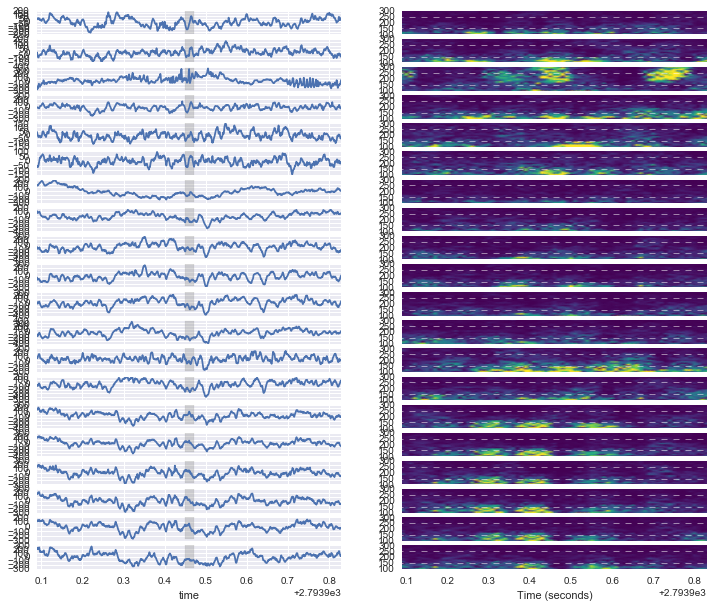

In [11]:
plot_ripple_metrics(ripple_df, 1, lfp_data, sampling_frequency)

## Raw power and coherence locked to the ripple

In [123]:
window_offset  = (-0.200, 0.200)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset))
lfp_segments = [lfp.reset_index(['time', 'segment_number']).pivot('time', 'segment_number')
                for lfp in lfp_segments]
tetrode_combinations = list(itertools.combinations(range(len(lfp_data)), 2))

# Preset function options
high_frequency_coherence = functools.partial(spectral.get_coherence_dataframe,
                              sampling_frequency=1500,
                              time_window_duration=0.020,
                              time_window_step=0.010,
                              desired_frequencies=[100, 300],
                              time_halfbandwidth_product=1,
                              number_of_tapers=1,
                              time=lfp_segments[0].index.values)

coherograms = [high_frequency_coherence(lfp_segments[tetrode_ind1].values, lfp_segments[tetrode_ind2].values)
               for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

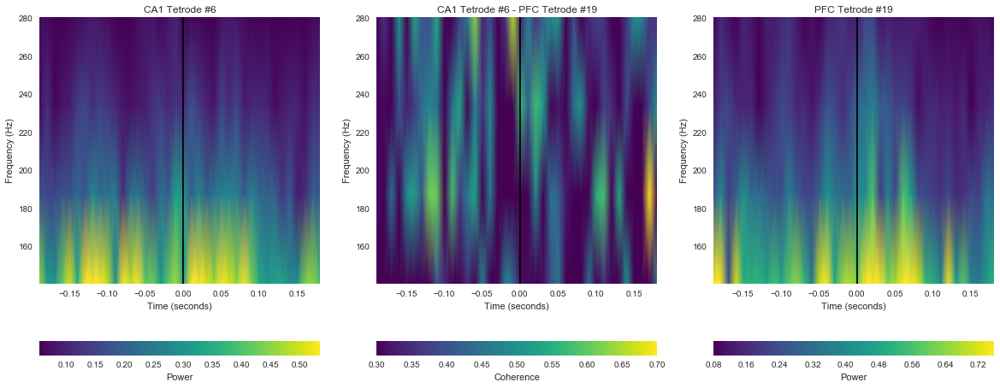

In [125]:
def coherence_title(tetrode_indices, cur_tetrode_info):
    return '{tetrode1} - {tetrode2}'.format(tetrode1=spectral.tetrode_title(tetrode_indices[0], cur_tetrode_info),
                    tetrode2=spectral.tetrode_title(tetrode_indices[1], cur_tetrode_info))

tetrode_combinations_index = [(tetrode_index[tetrode1], tetrode_index[tetrode2])
                              for tetrode1, tetrode2 in tetrode_combinations]

def plot_coherence_pair(tetrode_pair, coherograms, tetrode_combinations, cur_tetrode_info, tetrode_index,
                        cmap='viridis', vmin=0.3, vmax=0.7):
    tetrode_combinations_index = [(tetrode_index[tetrode1], tetrode_index[tetrode2])
                              for tetrode1, tetrode2 in tetrode_combinations]
    pair_ind = tetrode_combinations.index((tetrode_pair[0] - 1,tetrode_pair[1] - 1))
    fig, axis_handles = plt.subplots(1, 3, figsize=(20, 8))
    
    # Spectrogram 1
    mesh = spectral.plot_spectrogram(coherograms[pair_ind], axis_handles[0], spectrum_name='power_spectrum1',
                                     cmap='viridis')
    fig.colorbar(mesh, orientation='horizontal', ax=axis_handles[0], label='Power')
    axis_handles[0].set_title(spectral.tetrode_title(tetrode_combinations_index[pair_ind][0], cur_tetrode_info))
    axis_handles[0].vlines(0, coherograms[pair_ind].frequency.min(), coherograms[pair_ind].frequency.max())
    # Coherogram
    mesh = spectral.plot_coherogram(coherograms[pair_ind], axis_handles[1],
                                    cmap=cmap, vmin=vmin, vmax=vmax)
    fig.colorbar(mesh, orientation='horizontal', ax=axis_handles[1], label='Coherence')
    axis_handles[1].set_title(coherence_title(tetrode_combinations_index[pair_ind], cur_tetrode_info))
    axis_handles[1].vlines(0, coherograms[pair_ind].frequency.min(), coherograms[pair_ind].frequency.max())
    
    # Spectrogram 2
    mesh = spectral.plot_spectrogram(coherograms[pair_ind], axis_handles[2], spectrum_name='power_spectrum2',
                                     cmap='viridis')
    fig.colorbar(mesh, orientation='horizontal', ax=axis_handles[2], label='Power')
    axis_handles[2].set_title(spectral.tetrode_title(tetrode_combinations_index[pair_ind][1], cur_tetrode_info))
    axis_handles[2].vlines(0, coherograms[pair_ind].frequency.min(), coherograms[pair_ind].frequency.max())
    
plot_coherence_pair((6, 19), coherograms, tetrode_combinations, cur_tetrode_info, tetrode_index)

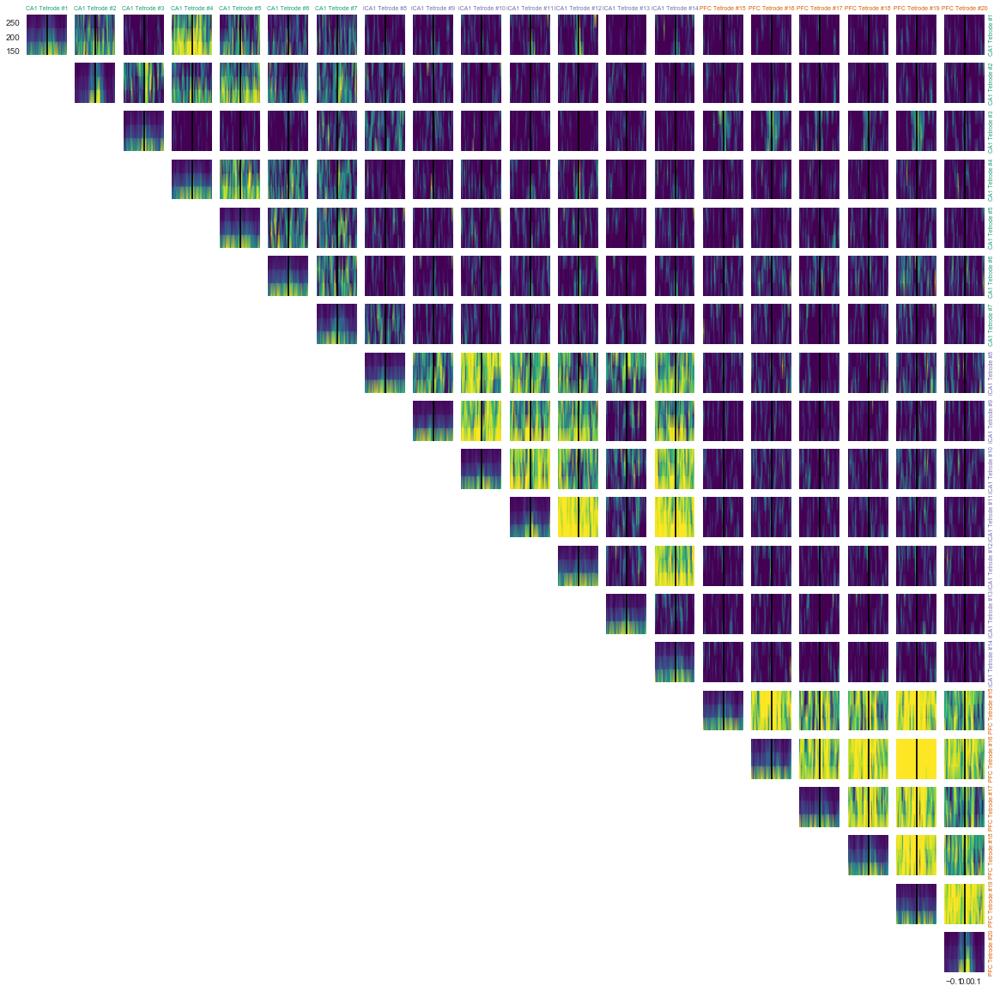

In [127]:
brain_area_to_color = {'CA1': '#1b9e77', 'iCA1': '#7570b3', 'PFC': '#d95f02'}

def plot_tetrode_matrix(cohereogram, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                        cmap='viridis', coherence_min=0.3, coherence_max=0.7, brain_area_to_color=None):

    fig, axis_handles = plt.subplots(num_tetrodes, num_tetrodes, figsize=(20, 20), sharex=True, sharey=True)

    for pair_ind, (tetrode_ind1, tetrode_ind2) in enumerate(tetrode_combinations):
        mesh = spectral.plot_coherogram(cohereogram[pair_ind], axis_handles[tetrode_ind1, tetrode_ind2],
                                        cmap=cmap, vmin=coherence_min, vmax=coherence_max)
        axis_handles[tetrode_ind1, tetrode_ind2].set_xlabel('')
        axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel('')
        axis_handles[tetrode_ind1, tetrode_ind2].vlines(0, cohereogram[pair_ind].frequency.min(),
                                                       cohereogram[pair_ind].frequency.max())
        axis_handles[tetrode_ind1, tetrode_ind2].locator_params(tight=False, nbins=4)
        if tetrode_ind1 == 0:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_title(spectral.tetrode_title(tetrode_index[tetrode_ind2], cur_tetrode_info),
                                                               fontsize=7, color=brain_area_to_color[brain_area])
        if tetrode_ind2 == num_tetrodes - 1:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind1], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel(spectral.tetrode_title(tetrode_index[tetrode_ind1], cur_tetrode_info),
                                                                fontsize=7, color=brain_area_to_color[brain_area])
            axis_handles[tetrode_ind1, tetrode_ind2].yaxis.set_label_position('right')

    for tetrode_ind1, tetrode_ind2 in tetrode_combinations:
        axis_handles[tetrode_ind2, tetrode_ind1].axis('off')

    for tetrode_ind1, tetrode_ind2  in [(ind, ind) for ind in range(0, num_tetrodes)]:
        spectral.plot_spectrogram(cohereogram[tetrode_ind1], axis_handles[tetrode_ind2, tetrode_ind2],
                                  spectrum_name='power_spectrum2', cmap='viridis')
        axis_handles[tetrode_ind2, tetrode_ind2].set_xlabel('')
        axis_handles[tetrode_ind2, tetrode_ind2].set_ylabel('')
        axis_handles[tetrode_ind2, tetrode_ind2].vlines(0, cohereogram[pair_ind].frequency.min(),
                                                       cohereogram[pair_ind].frequency.max())
        axis_handles[tetrode_ind2, tetrode_ind2].locator_params(tight=False, nbins=4)
        if tetrode_ind2 == 0:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_title(spectral.tetrode_title(tetrode_index[tetrode_ind2],
                                                                                      cur_tetrode_info),
                                                               fontsize=7, color=brain_area_to_color[brain_area])
        if tetrode_ind2 == num_tetrodes - 1:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel(spectral.tetrode_title(tetrode_index[tetrode_ind2],
                                                                                       cur_tetrode_info),
                                                                fontsize=7, color=brain_area_to_color[brain_area])
            axis_handles[tetrode_ind1, tetrode_ind2].yaxis.set_label_position('right')

num_tetrodes = len(lfp_data)
plot_tetrode_matrix(coherograms, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    brain_area_to_color=brain_area_to_color)

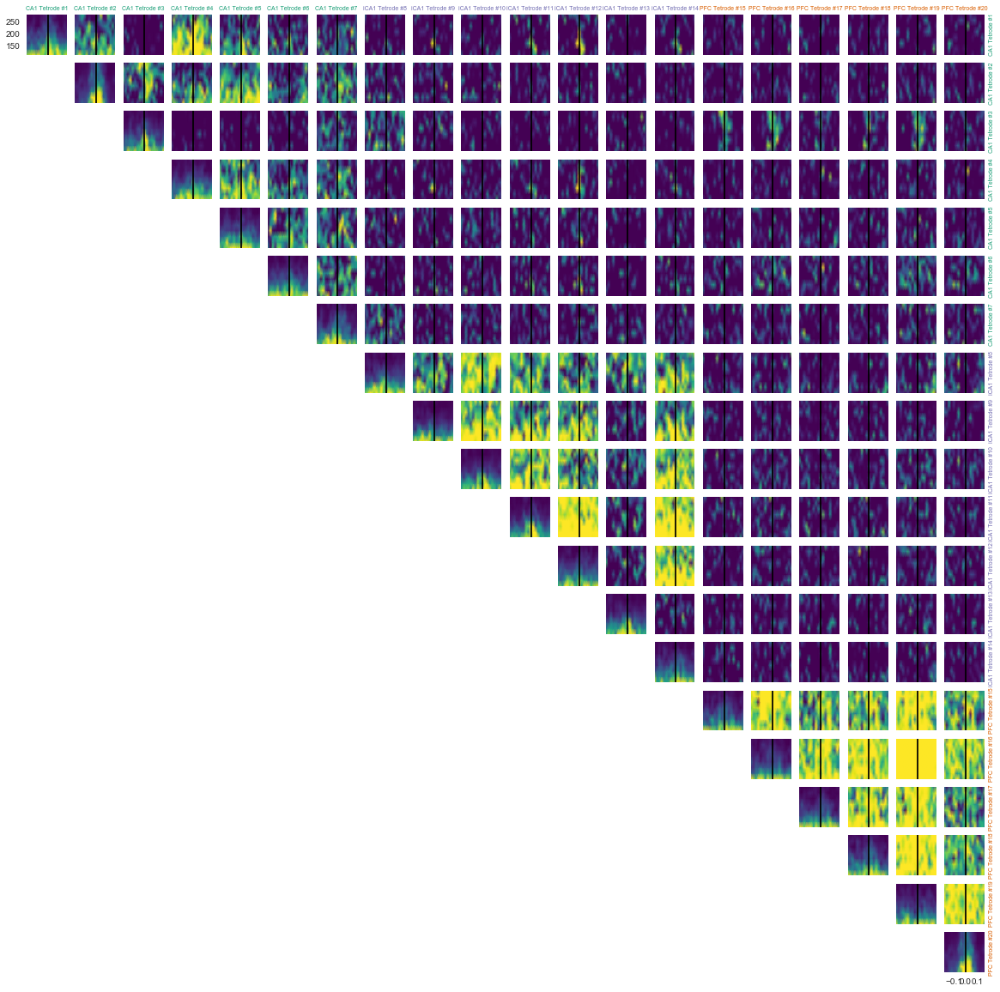

In [295]:
tetrode_combinations = list(itertools.combinations(range(len(lfp_data)), 2))

# Preset function options
high_frequency_coherence2 = functools.partial(spectral.get_coherence_dataframe,
                              sampling_frequency=sampling_frequency,
                              time_window_duration=0.040,
                              time_window_step=0.020,
                              desired_frequencies=[100, 300],
                              time_halfbandwidth_product=1,
                              number_of_tapers=1,
                              pad=0)

coherograms2 = [high_frequency_coherence2(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
               for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_tetrode_matrix(coherograms2, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes)

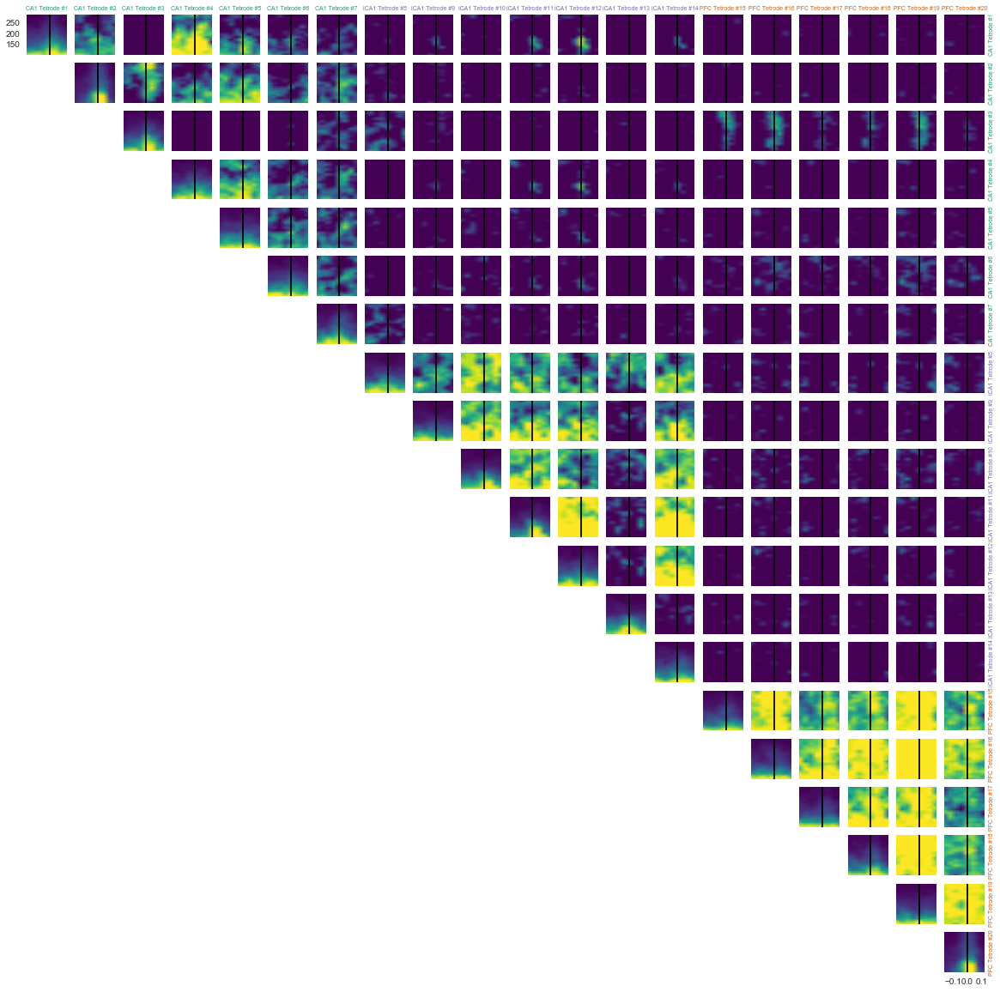

In [329]:
tetrode_combinations = list(itertools.combinations(range(len(lfp_data)), 2))

# Preset function options
high_frequency_coherence3 = functools.partial(spectral.get_coherence_dataframe,
                              sampling_frequency=sampling_frequency,
                              time_window_duration=0.080,
                              time_window_step=0.040,
                              desired_frequencies=[100, 300],
                              time_halfbandwidth_product=2,
                              number_of_tapers=3,
                              pad=0)

coherograms3 = [high_frequency_coherence3(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
               for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_tetrode_matrix(coherograms3, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes)

## Power and Coherence Change from Baseline
### High Frequency (100 - 300 Hz)

In [74]:
window_offset = (-0.250, -0.050)
lfp_segments_before_ripple = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

window_offset = (0, 0.200)
lfp_segments_after_ripple = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

In [75]:
# Preset function options
high_frequency_coherence = functools.partial(spectral.get_coherence_dataframe,
                              sampling_frequency=sampling_frequency,
                              time_window_duration=0.020,
                              time_window_step=0.010,
                              desired_frequencies=[100, 300],
                              time_halfbandwidth_product=1,
                              number_of_tapers=1)

high_frequency_baseline_coherence = functools.partial(spectral.multitaper_coherency,
                                                      sampling_frequency=sampling_frequency,
                                                      desired_frequencies=[100, 300],
                                                      time_halfbandwidth_product=(.2 * 50))

coherence_before = [pd.DataFrame(high_frequency_baseline_coherence([np.array(lfp_segments_before_ripple[tetrode_ind1].electric_potential), np.array(lfp_segments_before_ripple[tetrode_ind2].electric_potential)]))
                      for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence_before')]


coherograms_after = [high_frequency_coherence(lfp_segments_after_ripple[tetrode_ind1], lfp_segments_after_ripple[tetrode_ind2])
                      for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence_after')]

def normalize_power_coherence_by_baseline(dataframe_of_interest, dataframe_baseline):
    normalized_coherence = (dataframe_of_interest.set_index(['frequency', 'time']).sort_index() -
                            dataframe_baseline.set_index('frequency')).drop(['power_spectrum1', 'power_spectrum2'],
                                                                            axis=1)
    normalized_power = (dataframe_of_interest.set_index(['frequency', 'time']).sort_index() /
                        dataframe_baseline.set_index('frequency')).drop(['coherence_magnitude', 'coherence_phase'],
                                                                        axis=1)
    return pd.concat([normalized_coherence, normalized_power], axis=1)
    
normalize_power_coherence_by_baseline(coherograms_after[0], coherence_before[0])

coherence_magnitude  coherence_phase  power_spectrum1  \
frequency time                                                              
140.625   0.010000            -0.064185        -0.064772         2.868964   
          0.020033             0.032641        -0.374871         3.734323   
          0.030067             0.057545        -0.272420         1.394953   
          0.040100             0.009773        -0.080591         1.593300   
          0.050134            -0.055175         0.091405         0.994057   
          0.060167            -0.020699         0.426602         1.255028   
          0.070201            -0.009649         0.191084         1.101499   
          0.080234            -0.163991        -0.093368         1.269325   
          0.090268            -0.074532         0.257124         0.707219   
          0.100301             0.042646        -0.485065         0.909790   
          0.110334             0.010123         0.199953         1.318915   
          0.120368             0.105013         0.285900         0.955506   
          0.130401             0.047664        -0.134581         0.772016   
          0.140435            -0.066649        -0.070735         0.541277   
          0.150468            -0.158541         0.063929         0.656139   
          0.160502             0.177401        -0.220678         0.993481   
          0.170535             0.032842         0.238053         0.833271   
          0.180569             0.000910         0.178336         3.240105   
187.500   0.010000             0.166258         0.048021         4.057544   
          0.020033            -0.214267         0.698768         1.786606   
          0.030067             0.176520         0.293070         1.102167   
          0.040100             0.073616        -0.195194         1.843752   
          0.050134            -0.201583        -0.048461         1.245755   
          0.060167            -0.081446         0.117402         0.697389   
          0.070201             0.278435         0.066096         2.357415   
          0.080234             0.022914        -0.177435         1.736196   
          0.090268             0.058852         0.287527         0.921233   
          0.100301            -0.036416         0.033067         1.120591   
          0.110334             0.170001         0.532981         0.708189   
          0.120368             0.060270         0.200519         0.921950   
...                                 ...              ...              ...   
234.375   0.070201             0.158110        -0.515674         1.414331   
          0.080234            -0.144153        -0.027693         1.102632   
          0.090268            -0.239458        -0.501915         0.983346   
          0.100301             0.039396         0.092021         1.291399   
          0.110334             0.025279         0.640794         0.981290   
          0.120368             0.019450         0.020299         0.876571   
          0.130401             0.120025        -0.011148         1.096820   
          0.140435            -0.019678         0.221769         0.895413   
          0.150468             0.127387        -0.421744         0.811388   
          0.160502            -0.211469         0.235351         1.092070   
          0.170535            -0.069317        -0.050457         2.105025   
          0.180569             0.029076        -0.160712         1.204728   
281.250   0.010000            -0.200874         0.957592         1.041439   
          0.020033            -0.005412        -0.072645         1.178536   
          0.030067             0.274615        -0.198485         1.005690   
          0.040100             0.081170        -0.012934         0.786552   
          0.050134            -0.007737        -0.096900         1.276372   
          0.060167             0.049993         0.612560         1.549557   
          0.070201             0.004507         0.743806         1.992052   
          0.0802

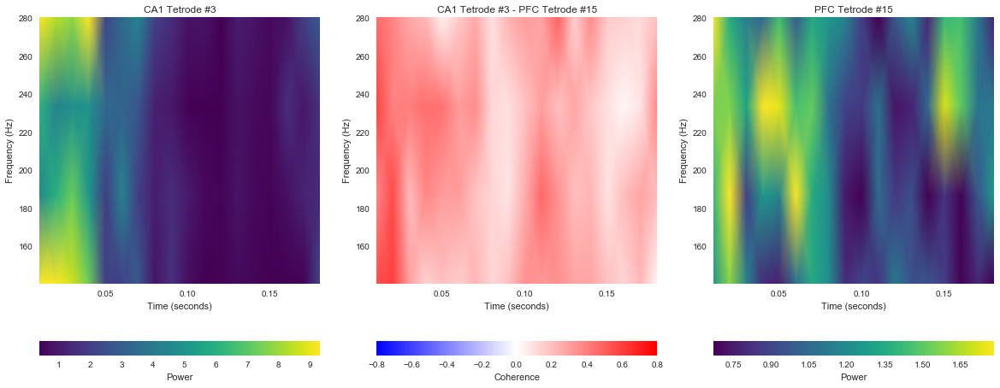

In [505]:
coherence_difference = [normalize_power_coherence_by_baseline(after, baseline).reset_index()
                        for after, baseline in zip(coherograms_after, coherence_before)]
plot_coherence_pair((3, 15), coherence_difference, tetrode_combinations, cur_tetrode_info, tetrode_index,
                    cmap='bwr', vmin=-0.8, vmax=0.8)

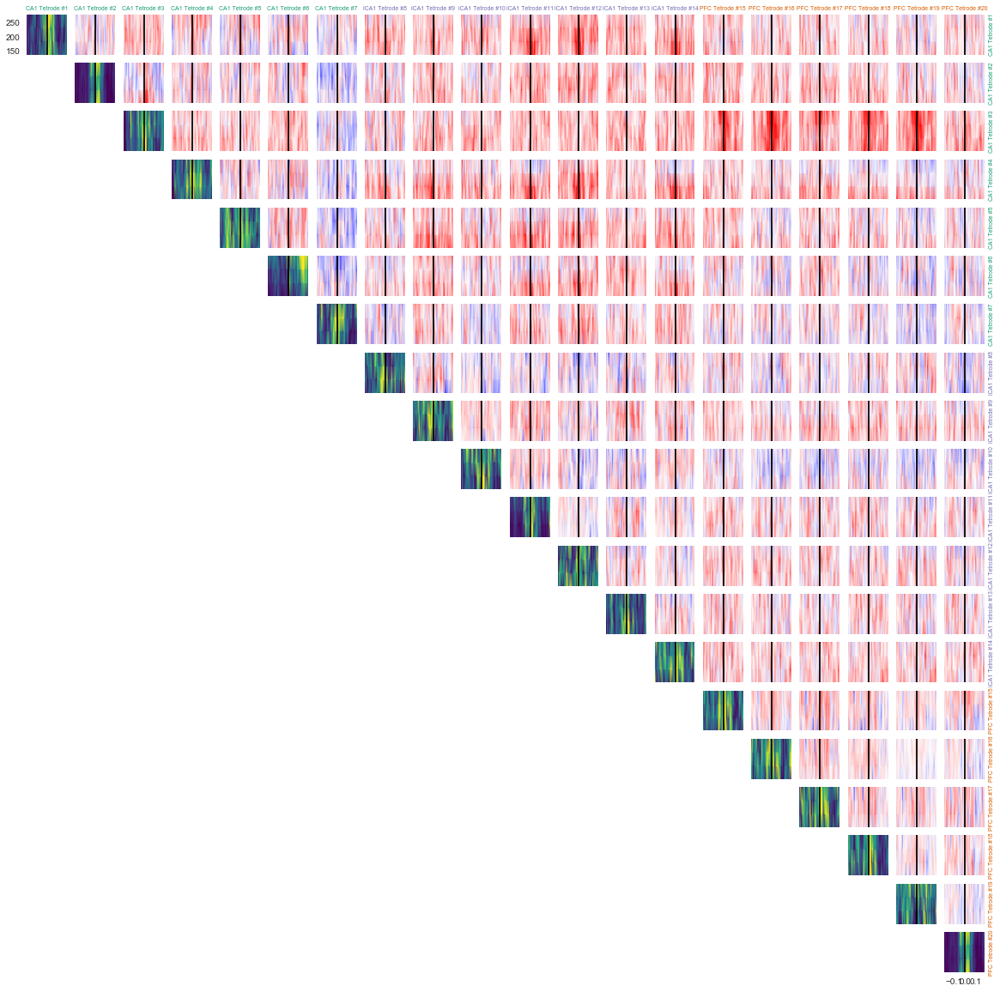

In [76]:
def difference_from_baseline_coherence(lfp_data, times_of_interest, tetrode_combinations,
                                       baseline_window=(-0.250, -0.050), window_of_interest=(0, .200),
                                       sampling_frequency=1000, time_window_duration=0.020, time_window_step=None,
                                       desired_frequencies=None, time_halfbandwidth_product=3,
                                       number_of_tapers=None):
    ''''''

    coherogram = functools.partial(spectral.get_coherence_dataframe,
                                   sampling_frequency=sampling_frequency,
                                   time_window_duration=time_window_duration,
                                   time_window_step=time_window_step,
                                   desired_frequencies=desired_frequencies,
                                   time_halfbandwidth_product=time_halfbandwidth_product,
                                   number_of_tapers=number_of_tapers)
    
    half_bandwidth = time_halfbandwidth_product / time_window_duration
    baseline_duration = baseline_window[1] - baseline_window[0]
    baseline_time_halfbandwidth_product = half_bandwidth * baseline_duration
    assert baseline_time_halfbandwidth_product >= 1
    if 2 * baseline_time_halfbandwidth_product - 1 > 10:
        number_baseline_tapers = 10
    else:
        number_baseline_tapers = 2 * baseline_time_halfbandwidth_product - 1

    coherence = functools.partial(spectral.multitaper_coherency,
                                  sampling_frequency=sampling_frequency,
                                  desired_frequencies=desired_frequencies,
                                  time_halfbandwidth_product=baseline_time_halfbandwidth_product,
                                  number_of_tapers=number_baseline_tapers)
    baseline_lfp_segments = list(ripples.reshape_to_segments(lfp_data, times_of_interest,
                                                             baseline_window, sampling_frequency))
    time_of_interest_lfp_segments = list(ripples.reshape_to_segments(lfp_data, times_of_interest,
                                                                     window_of_interest, sampling_frequency))
    coherence_baseline = [pd.DataFrame(coherence([baseline_lfp_segments[tetrode_ind1].electric_potential.values,
                                                  baseline_lfp_segments[tetrode_ind2].electric_potential.values]
                                                 )
                                      )
                          for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations,
                                                                               desc='coherence_before')]

    coherograms_after = [coherogram(time_of_interest_lfp_segments[tetrode_ind1],
                                    time_of_interest_lfp_segments[tetrode_ind2])
                         for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations,
                                                                              desc='coherence_after')]
    return [normalize_power_coherence_by_baseline(after, baseline).reset_index()
            for after, baseline in zip(coherograms_after, coherence_baseline)]


coherence_difference = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.020,
                                                          time_window_step=0.010,
                                                          desired_frequencies=[100, 300],
                                                          time_halfbandwidth_product=1,
                                                          number_of_tapers=1,
                                                          baseline_window=(-0.250, -0.050),
                                                          window_of_interest=(-0.200, .200))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

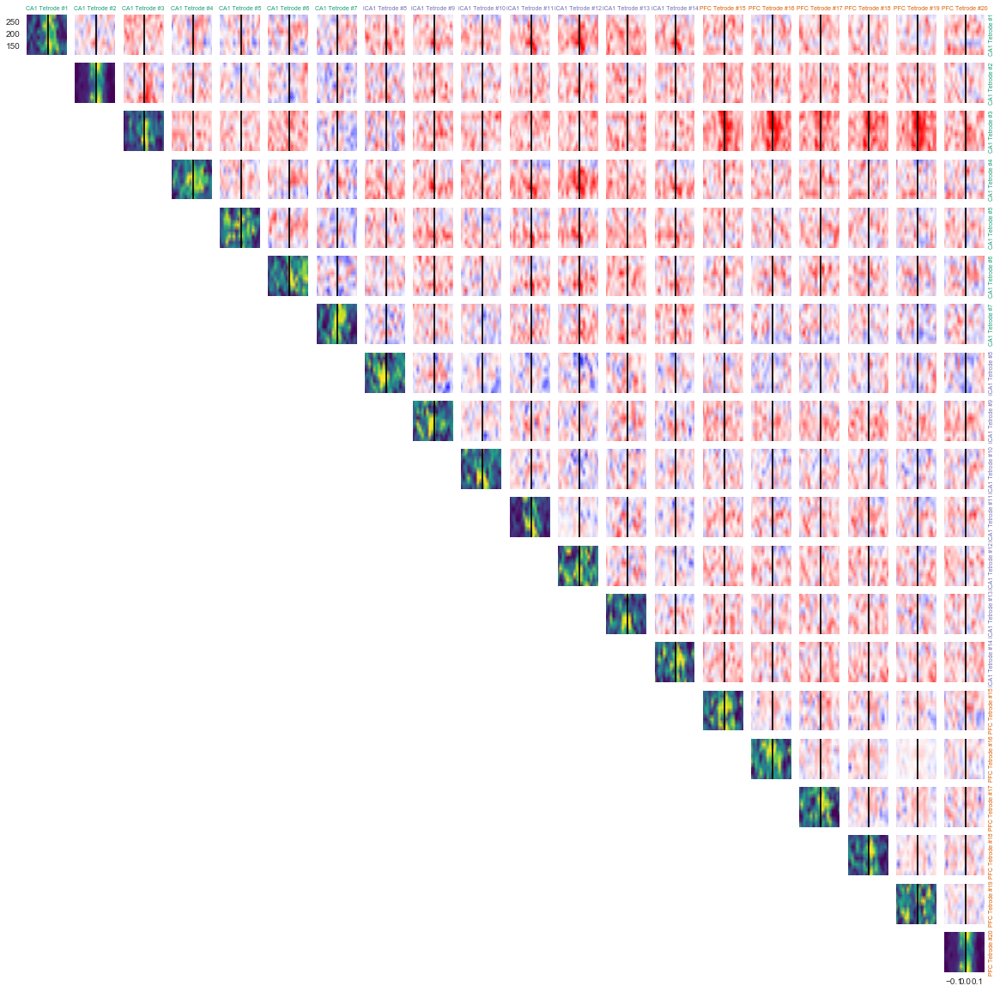

In [509]:
coherence_difference2 = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.040,
                                                          time_window_step=0.020,
                                                          desired_frequencies=[100, 300],
                                                          time_halfbandwidth_product=1,
                                                          number_of_tapers=1,
                                                          baseline_window=(-0.250, -0.050),
                                                          window_of_interest=(-.200, .200))

plot_tetrode_matrix(coherence_difference2, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

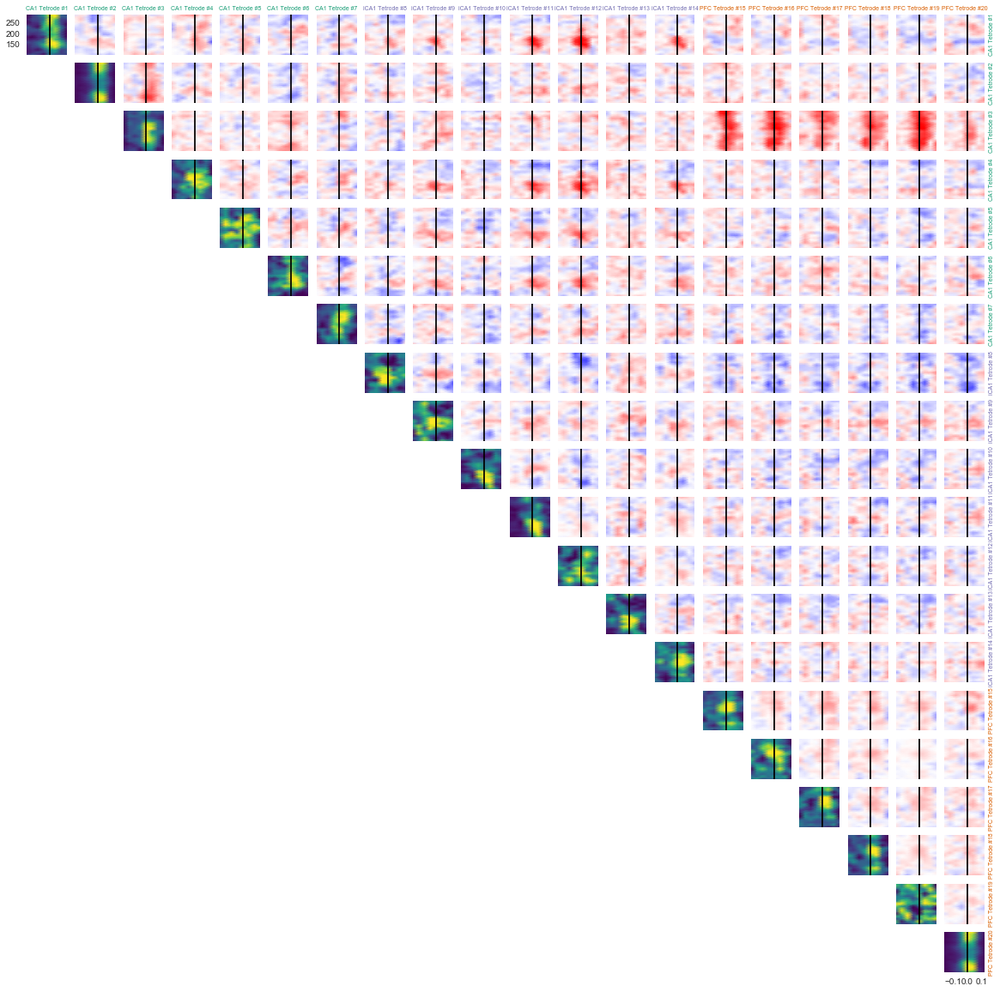

In [267]:
coherence_difference3 = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.080,
                                                          time_window_step=0.040,
                                                          desired_frequencies=[100, 300],
                                                          time_halfbandwidth_product=2,
                                                          number_of_tapers=3,
                                                          baseline_window=(-0.250, -0.050),
                                                          window_of_interest=(-0.200, .200))

plot_tetrode_matrix(coherence_difference3, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

### Medium Frequency (20 - 100 Hz)

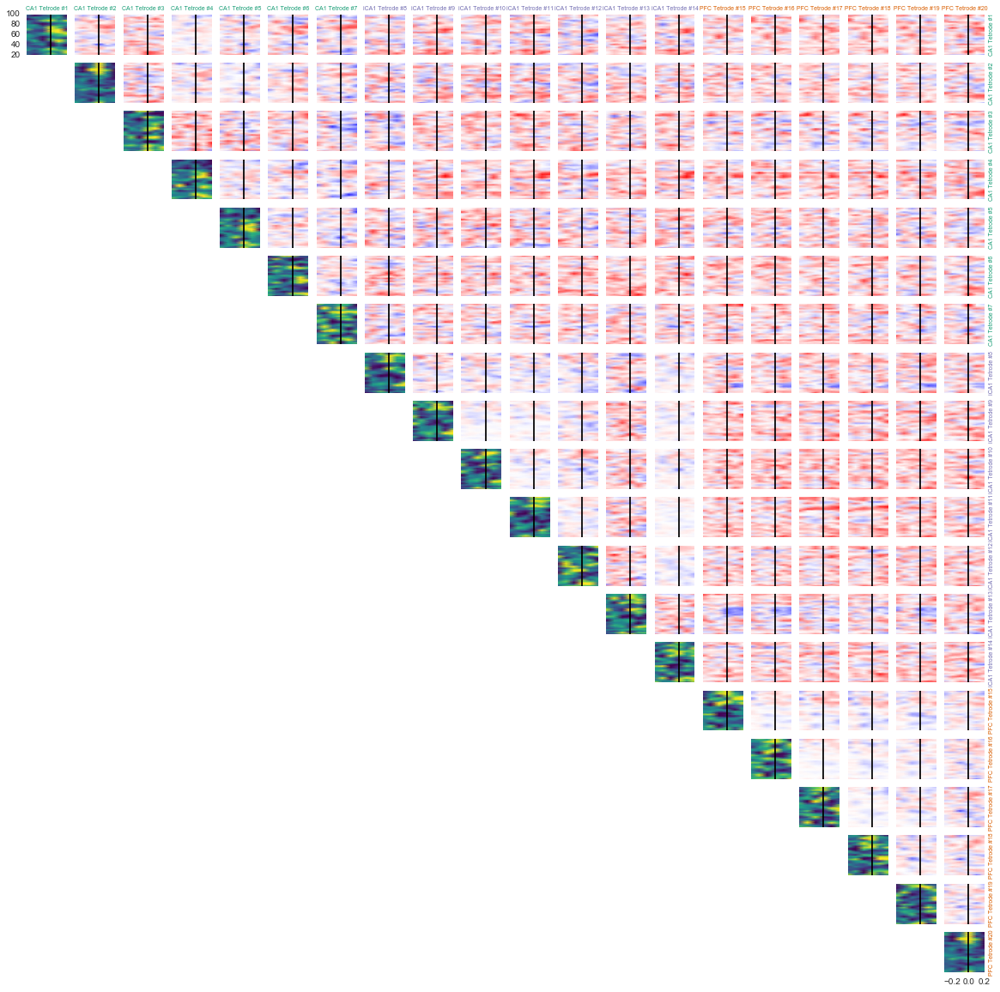

In [525]:
coherence_difference = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.200,
                                                          time_window_step=0.100,
                                                          desired_frequencies=[20, 100],
                                                          time_halfbandwidth_product=1,
                                                          baseline_window=(-0.450, -0.050),
                                                          window_of_interest=(-0.400, 0.400))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

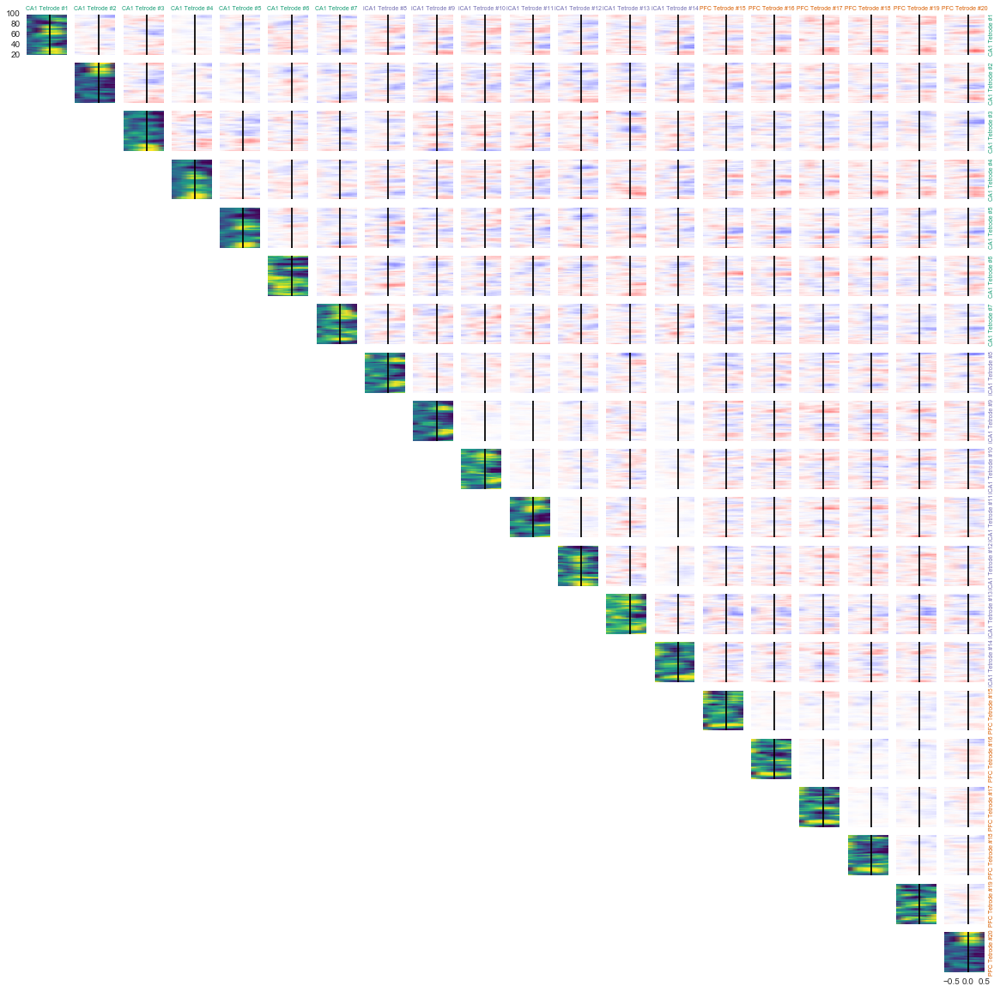

In [521]:
coherence_difference = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.600,
                                                          time_window_step=0.300,
                                                          desired_frequencies=[20, 100],
                                                          time_halfbandwidth_product=3,
                                                          baseline_window=(-1.050, -0.050),
                                                          window_of_interest=(-1.000, 1.000))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

### Low Frequencies  (0 - 20 Hz)

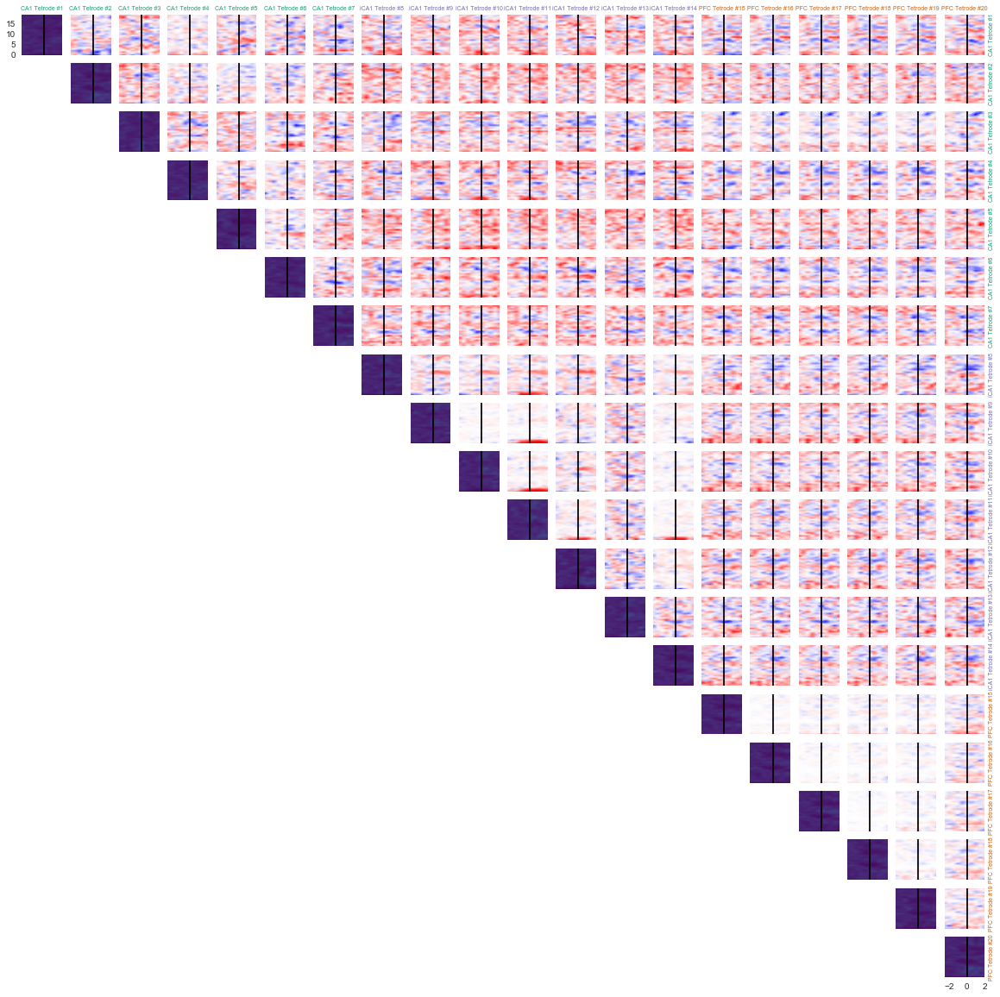

In [432]:
coherence_difference = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=1.000,
                                                          time_window_step=0.500,
                                                          desired_frequencies=[0, 20],
                                                          time_halfbandwidth_product=1,
                                                          baseline_window=(-3.050, -0.050),
                                                          window_of_interest=(-3.000, 3.000))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

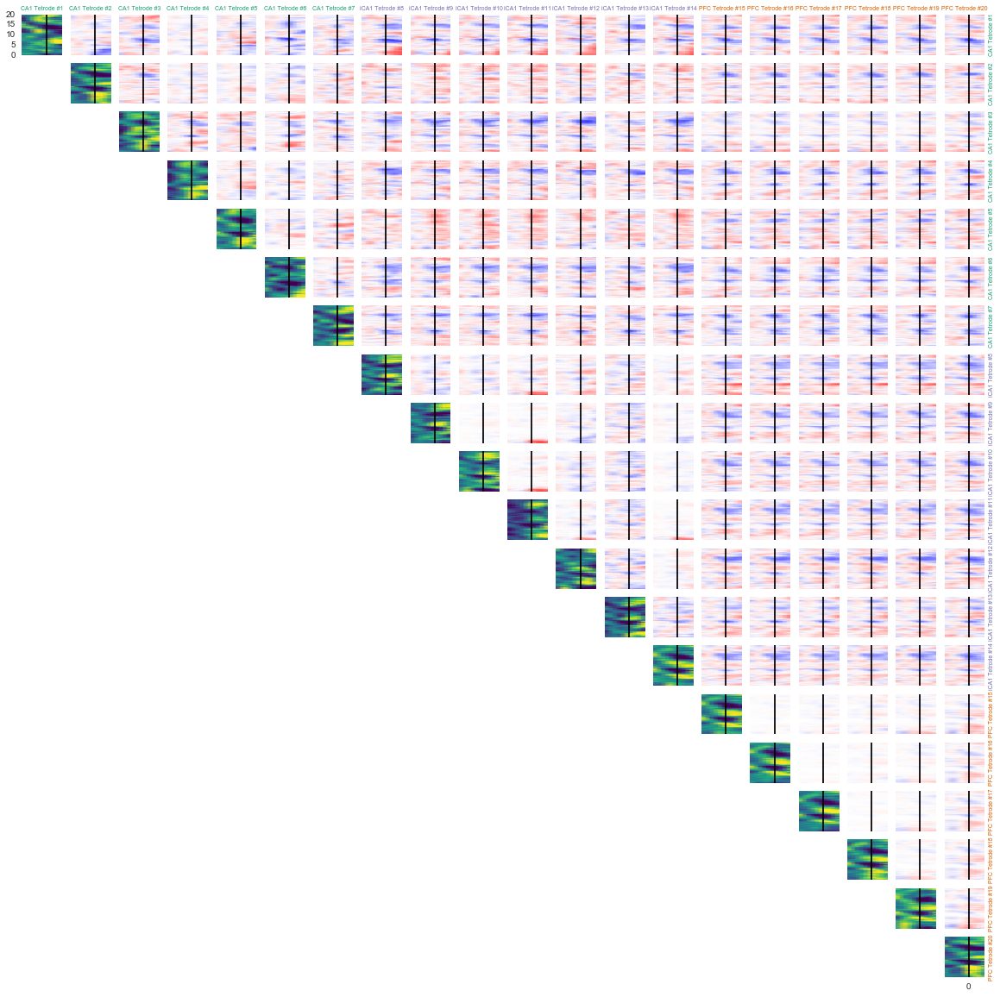

In [524]:
coherence_difference = difference_from_baseline_coherence(lfp_data, ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=3.000,
                                                          time_window_step=1.500,
                                                          desired_frequencies=[0, 20],
                                                          time_halfbandwidth_product=3,
                                                          baseline_window=(-6.050, -0.050),
                                                          window_of_interest=(-6.000, 6.000))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

## Their ripples

In [128]:
frank_individual_ripple_times = [ripples._get_computed_ripple_times(tetrode_tuple, animals)
                                 for tetrode_tuple in data_filter.get_dataframe_index(cur_tetrode_info[cur_tetrode_info.area == 'CA1'])]
merged_frank_segments = list(ripples.merge_ranges([seg for tetrode in frank_individual_ripple_times
                                         for seg in tetrode]))

speed_threshold = 4
interpolated_position = (pd.concat([lfp_data[0], position_dataframe])
                            .sort_index()
                            .interpolate(method='linear')
                            .reindex(lfp_data[0].index))

frank_average_speed = np.array([interpolated_position.loc[segment_start:segment_end, :].smoothed_speed.mean()
                                for segment_start, segment_end in merged_frank_segments])
frank_ripple_times = [merged_frank_segments[i] for i in np.where(frank_average_speed <= speed_threshold)[0]]

### High Frequencies (100 - 300 Hz)

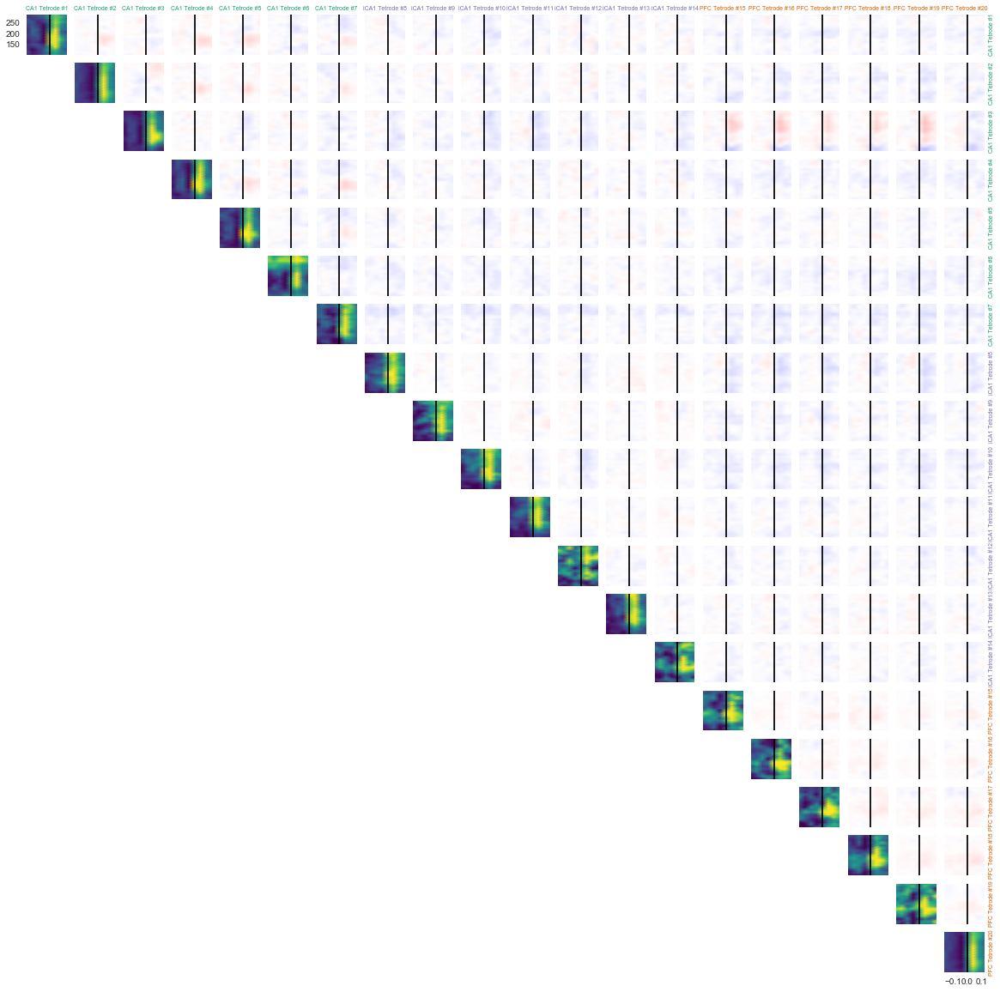

In [94]:
coherence_difference = difference_from_baseline_coherence(lfp_data, frank_ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.080,
                                                          time_window_step=0.040,
                                                          desired_frequencies=[100, 300],
                                                          time_halfbandwidth_product=2,
                                                          number_of_tapers=3,
                                                          baseline_window=(-0.250, -0.050),
                                                          window_of_interest=(-0.200, .200))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

### Medium Frequencies (20 - 100 Hz)

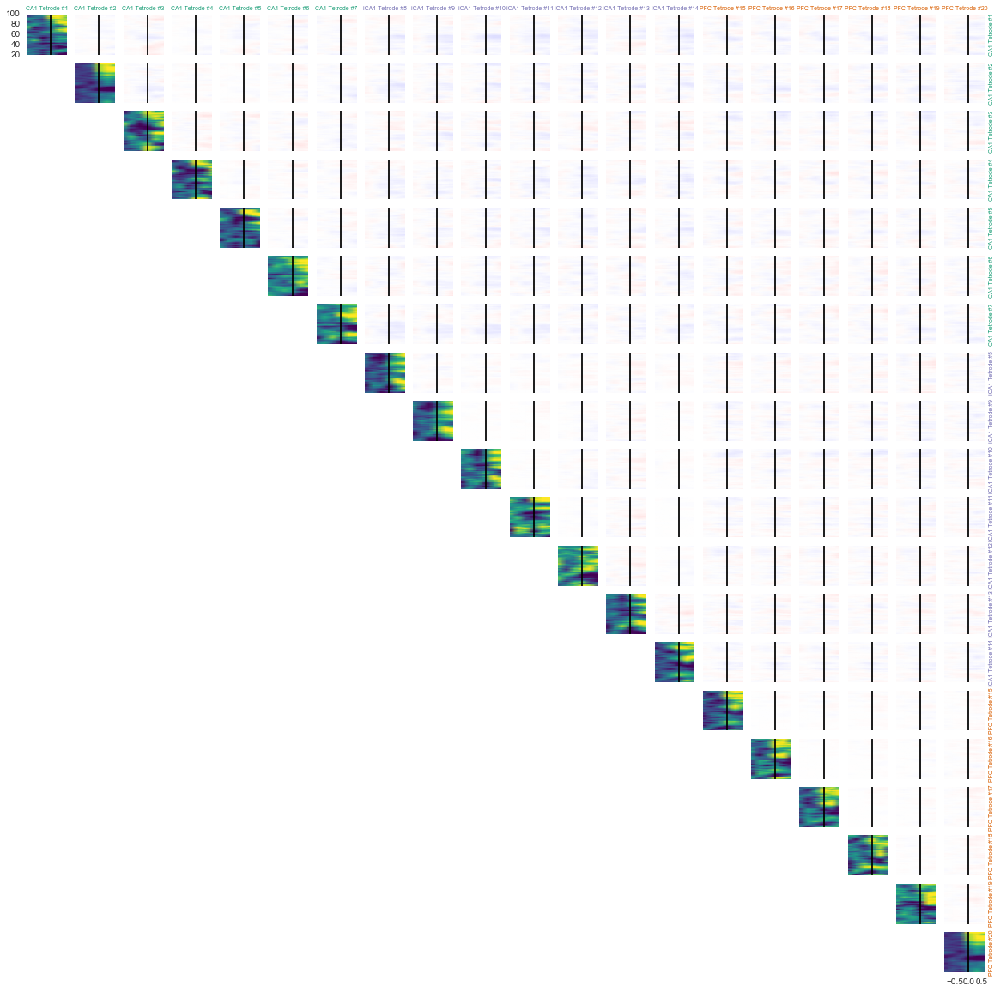

In [203]:
coherence_difference = difference_from_baseline_coherence(lfp_data, frank_ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=0.600,
                                                          time_window_step=0.300,
                                                          desired_frequencies=[20, 100],
                                                          time_halfbandwidth_product=3,
                                                          baseline_window=(-1.250, -0.050),
                                                          window_of_interest=(-1.200, 1.200))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

### Low Frequencies (0 - 20 Hz)

In [421]:
coherence_difference = difference_from_baseline_coherence(lfp_data, frank_ripple_times, tetrode_combinations,
                                                          sampling_frequency=1500,
                                                          time_window_duration=3.000,
                                                          time_window_step=1.500,
                                                          desired_frequencies=[0, 20],
                                                          time_halfbandwidth_product=3,
                                                          baseline_window=(-6.050, -0.050),
                                                          window_of_interest=(-6.000, 6.000))

plot_tetrode_matrix(coherence_difference, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                    cmap='bwr', coherence_min=-0.5, coherence_max=0.5)

KeyboardInterrupt: 

## Ripple Triggered Averages

### Multitaper Ripples

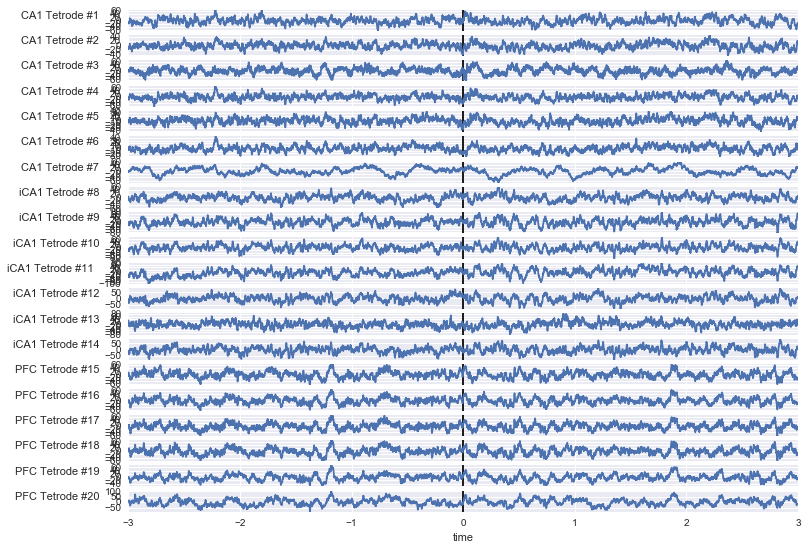

In [431]:
window_of_interest = (-3.000, 3.000)
time_of_interest_lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times,
                                                                 window_of_interest, sampling_frequency))

ripple_triggered_average1 = [lfp.electric_potential.mean(axis=1) for lfp in time_of_interest_lfp_segments]
num_lfps = len(ripple_triggered_average1)

fig, axis_handles = plt.subplots(num_lfps, 1, figsize=(12, 9), sharex=True)

# LFP
for ind in range(0, num_lfps):
    ripple_triggered_average1[ind].plot(ax=axis_handles[ind], legend=False)
    axis_handles[ind].vlines(0, ripple_triggered_average1[ind].min(),
                                ripple_triggered_average1[ind].max())
    axis_handles[ind].set_ylim((ripple_triggered_average1[ind].min(),
                                ripple_triggered_average1[ind].max()))
    axis_handles[ind].set_ylabel(spectral.tetrode_title(tetrode_index[ind], cur_tetrode_info),
                                 horizontalalignment='right',
                                 rotation='horizontal')

### Frank Lab Ripples

In [1]:
sampling_frequency = 1500
window_of_interest = (-3.000, 3.000)
time_of_interest_lfp_segments = list(ripples.reshape_to_segments(lfp_data, frank_ripple_times,
                                                                 window_of_interest, sampling_frequency))

ripple_triggered_average2 = [lfp.electric_potential.mean(axis=1) for lfp in time_of_interest_lfp_segments]
num_lfps = len(ripple_triggered_average1)

fig, axis_handles = plt.subplots(num_lfps, 1, figsize=(12, 9), sharex=True)

# LFP
for ind in range(0, num_lfps):
    ripple_triggered_average2[ind].plot(ax=axis_handles[ind], legend=False)
    axis_handles[ind].vlines(0, ripple_triggered_average2[ind].min(),
                                ripple_triggered_average2[ind].max())
    axis_handles[ind].set_ylim((ripple_triggered_average2[ind].min(),
                                ripple_triggered_average2[ind].max()))
    axis_handles[ind].set_ylabel(spectral.tetrode_title(tetrode_index[ind], cur_tetrode_info),
                                 horizontalalignment='right',
                                 rotation='horizontal')

NameError: name 'ripples' is not defined

## Group Delay

### Prototyping

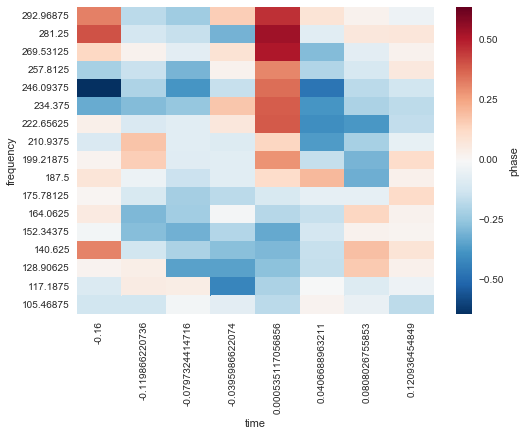

In [373]:
import matplotlib.ticker
ax = sns.heatmap(coherograms3[0].set_index(['frequency', 'time']).sort_index().coherence_phase.unstack(),
                 cbar_kws={'label': 'phase'})
ax.invert_yaxis() 
# ax.yaxis.set_major_formatter(matplotlib.ticker.StrMethodFormatter('${x:,.0f}'))
# plt.xticks(rotation=0)

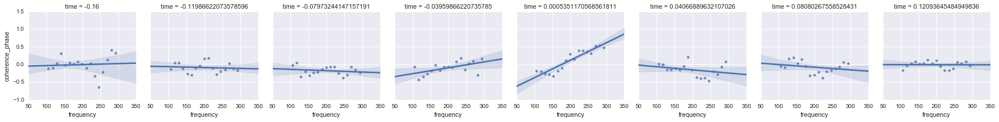

In [331]:
data = coherograms3[0].drop(['coherence_magnitude', 'power_spectrum1', 'power_spectrum2'], axis=1)
g = sns.FacetGrid(data, col='time')
g.map(sns.regplot, 'frequency', 'coherence_phase')

In [433]:
ripple_coherence = functools.partial(spectral.get_coherence_dataframe,
                                     sampling_frequency=1500,
                                     time_window_duration=0.080,
                                     time_window_step=0.040,
                                     desired_frequencies=[0, 300],
                                     time_halfbandwidth_product=,
                                     pad=0)

window_offset  = (-0.400, 0.400)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

coherograms_ripple = [ripple_coherence(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
                      for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

data = coherograms_ripple[0].drop(['coherence_magnitude', 'power_spectrum1', 'power_spectrum2'], axis=1)
g = sns.FacetGrid(data, col='time')
g.map(sns.regplot, 'frequency', 'coherence_phase')

AttributeError: 'list' object has no attribute 'drop'

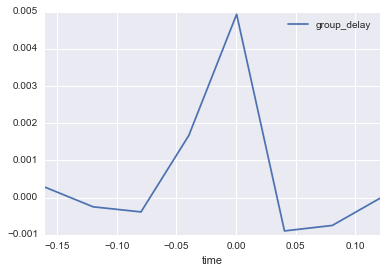

In [332]:
import scipy.stats
def group_delay(df):
    return pd.Series({'group_delay': scipy.stats.linregress(df.frequency, df.coherence_phase)[0]})
ax = coherograms3[0].groupby('time').apply(group_delay).plot()

def get_group_delay(coherence_dataframe):
    return coherence_dataframe.groupby('time').apply(group_delay)
    

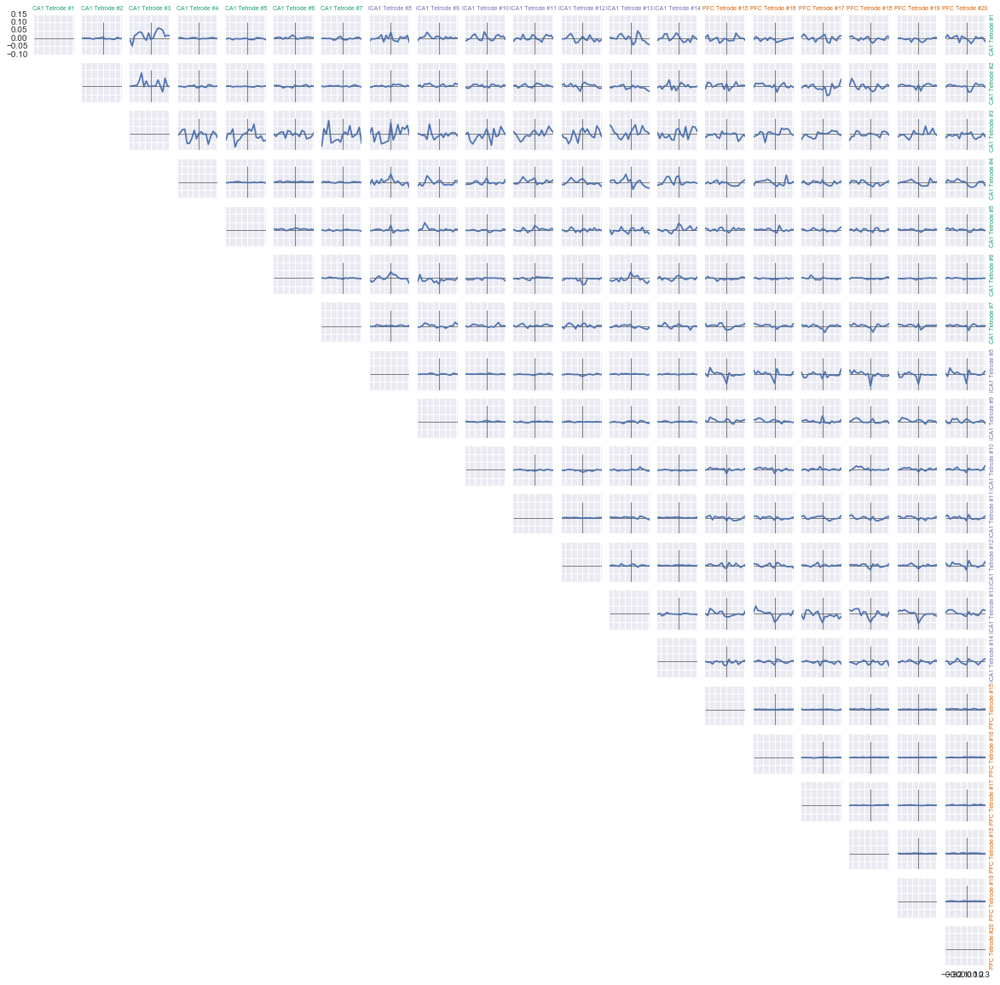

In [428]:
def plot_group_delay_matrix(coherograms, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                            brain_area_to_color, slope_min=-0.20, slope_max=0.20):
    fig, axis_handles = plt.subplots(num_tetrodes, num_tetrodes, figsize=(20, 20), sharex=True, sharey=True)

    for pair_ind, (tetrode_ind1, tetrode_ind2) in enumerate(tqdm.tqdm_notebook(tetrode_combinations,
                                                                               desc='tetrode_pairs')):
        group_delay_df = get_group_delay(coherograms[pair_ind])
        axis_handles[tetrode_ind1, tetrode_ind2].plot(group_delay_df.index, group_delay_df.group_delay)
        axis_handles[tetrode_ind1, tetrode_ind2].set_xlabel('')
        axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel('')
        axis_handles[tetrode_ind1, tetrode_ind2].vlines(0, slope_min, slope_max, linewidth=0.5)
        axis_handles[tetrode_ind1, tetrode_ind2].set_xlim((group_delay_df.index.min(),
                                                        group_delay_df.index.max()))
        axis_handles[tetrode_ind1, tetrode_ind2].hlines(0, group_delay_df.index.min(),
                                                        group_delay_df.index.max(),
                                                        linewidth=0.5)
        if tetrode_ind1 == 0:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_title(spectral.tetrode_title(tetrode_index[tetrode_ind2],
                                                                                      cur_tetrode_info),
                                                               fontsize=7, color=brain_area_to_color[brain_area])
        if tetrode_ind2 == num_tetrodes - 1:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind1], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel(spectral.tetrode_title(tetrode_index[tetrode_ind1],
                                                                                      cur_tetrode_info),
                                                                fontsize=7, color=brain_area_to_color[brain_area])
            axis_handles[tetrode_ind1, tetrode_ind2].yaxis.set_label_position('right')

    for tetrode_ind1, tetrode_ind2 in tetrode_combinations:
        axis_handles[tetrode_ind2, tetrode_ind1].axis('off')

    for tetrode_ind1, tetrode_ind2  in [(ind, ind) for ind in range(0, num_tetrodes)]:
        axis_handles[tetrode_ind2, tetrode_ind2].set_xlabel('')
        axis_handles[tetrode_ind2, tetrode_ind2].set_ylabel('')
        axis_handles[tetrode_ind2, tetrode_ind2].hlines(0, group_delay_df.index.min(),
                                                    group_delay_df.index.max(),
                                                    linewidth=0.5)
        if tetrode_ind2 == 0:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_title(spectral.tetrode_title(tetrode_index[tetrode_ind2],
                                                                                      cur_tetrode_info),
                                                               fontsize=7, color=brain_area_to_color[brain_area])
        if tetrode_ind2 == num_tetrodes - 1:
            brain_area = cur_tetrode_info.loc[tetrode_index[tetrode_ind2], 'area']
            axis_handles[tetrode_ind1, tetrode_ind2].set_ylabel(spectral.tetrode_title(tetrode_index[tetrode_ind2],
                                                                                       cur_tetrode_info),
                                                                fontsize=7, color=brain_area_to_color[brain_area])
            axis_handles[tetrode_ind1, tetrode_ind2].yaxis.set_label_position('right')

# Preset function options
ripple_coherence = functools.partial(spectral.get_coherence_dataframe,
                                     sampling_frequency=1500,
                                     time_window_duration=0.080,
                                     time_window_step=0.040,
                                     desired_frequencies=[150, 250],
                                     time_halfbandwidth_product=2,
                                     pad=0)

window_offset  = (-0.400, 0.400)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

coherograms_ripple = [ripple_coherence(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
                      for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_group_delay_matrix(coherograms_ripple, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                        brain_area_to_color, slope_min=-0.10, slope_max=0.10)

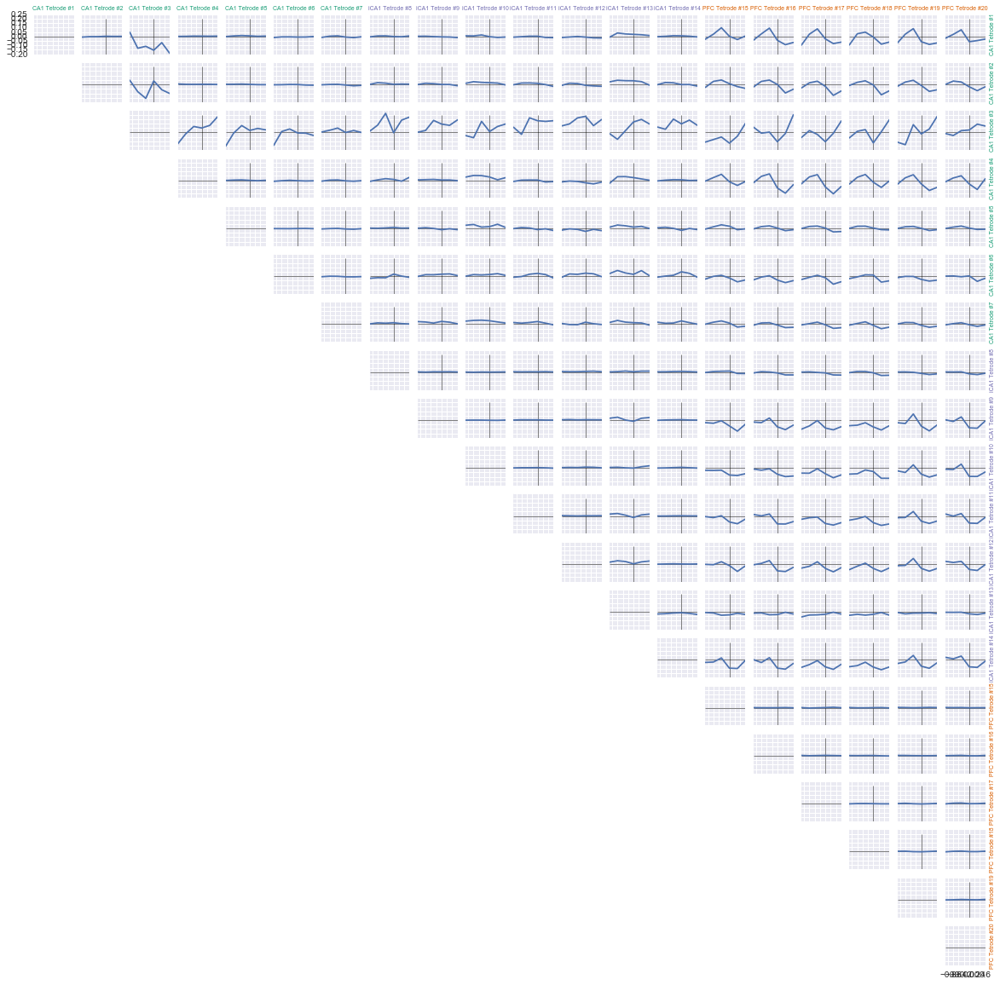

In [423]:
high_gamma_coherence = functools.partial(spectral.get_coherence_dataframe,
                               sampling_frequency=1500,
                               time_window_duration=0.600,
                               time_window_step=0.300,
                               desired_frequencies=[50, 90],
                               time_halfbandwidth_product=3,
                               pad=0)
                       
window_offset  = (-1.200, 1.200)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

coherograms_high_gamma = [high_gamma_coherence(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
                          for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_group_delay_matrix(coherograms_high_gamma, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                        brain_area_to_color)

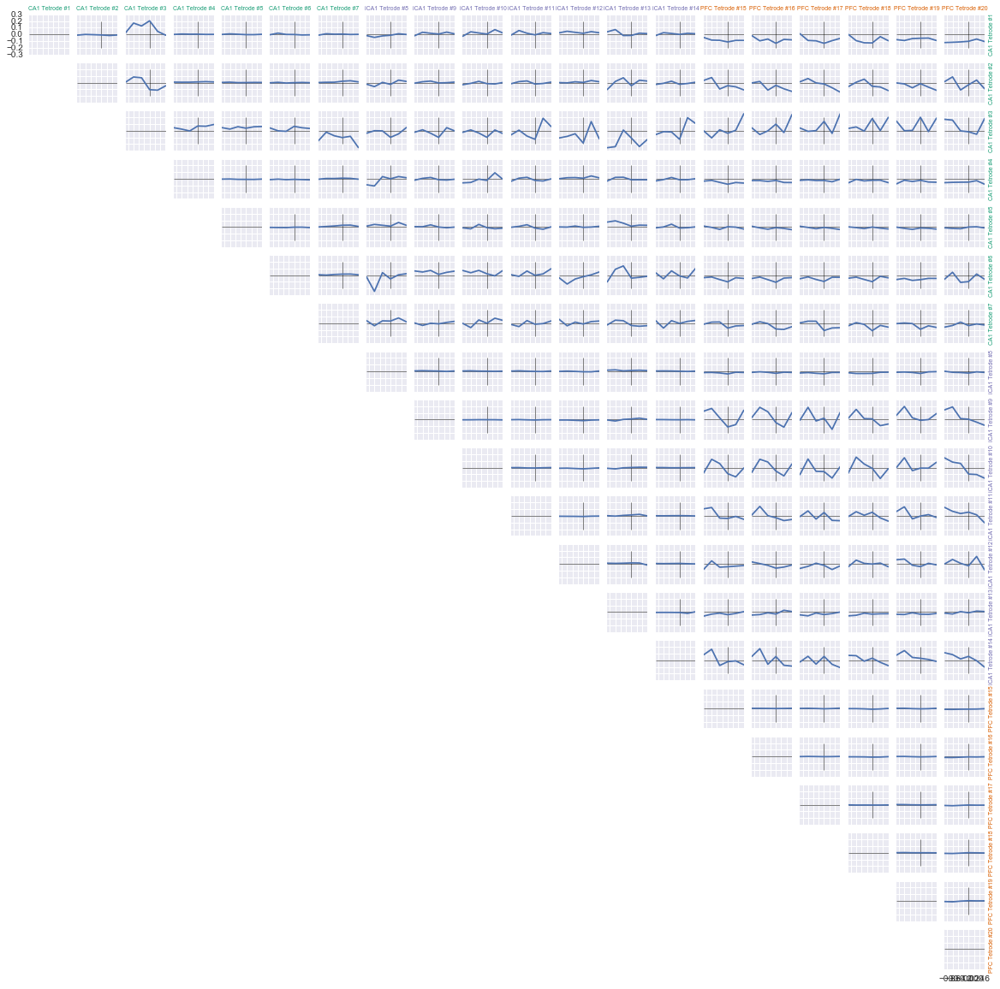

In [424]:
low_gamma_coherence = functools.partial(spectral.get_coherence_dataframe,
                               sampling_frequency=1500,
                               time_window_duration=0.600,
                               time_window_step=0.300,
                               desired_frequencies=[20, 50],
                               time_halfbandwidth_product=3,
                               pad=0)
                       
window_offset  = (-1.200, 1.200)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

coherograms_low_gamma = [low_gamma_coherence(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
                         for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_group_delay_matrix(coherograms_low_gamma, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                        brain_area_to_color)

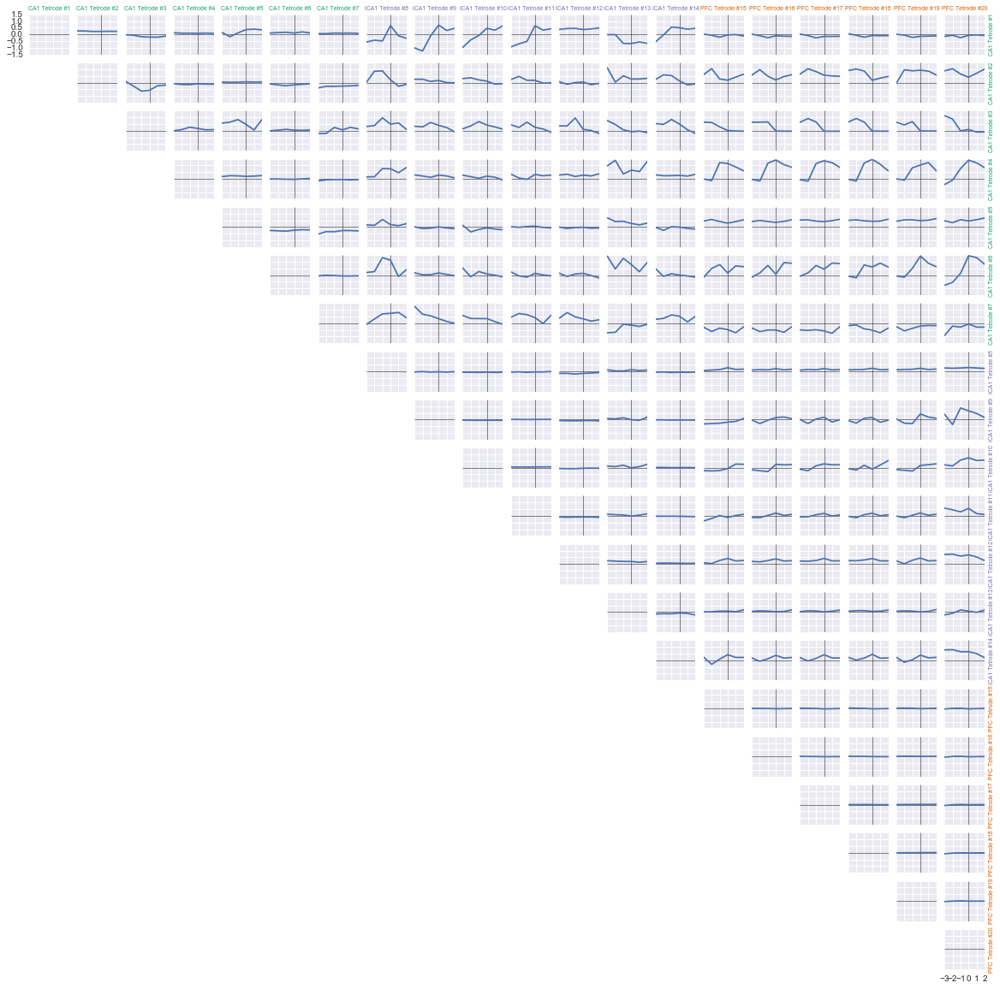

In [429]:
theta_coherence = functools.partial(spectral.get_coherence_dataframe,
                          sampling_frequency=1500,
                          time_window_duration=2.000,
                          time_window_step=1.000,
                          desired_frequencies=[6, 12],
                          time_halfbandwidth_product=2,
                          pad=0)
                       
window_offset  = (-4.000, 4.000)
sampling_frequency = 1500
lfp_segments = list(ripples.reshape_to_segments(lfp_data, ripple_times, window_offset, sampling_frequency))

coherograms_theta = [theta_coherence(lfp_segments[tetrode_ind1], lfp_segments[tetrode_ind2])
                     for tetrode_ind1, tetrode_ind2 in tqdm.tqdm_notebook(tetrode_combinations, desc='coherence')]

plot_group_delay_matrix(coherograms_theta, tetrode_combinations, tetrode_index, cur_tetrode_info, num_tetrodes,
                        brain_area_to_color, slope_min=-1.50, slope_max=1.50)